In [2]:
import os
import sys
import re
import json
import numpy as np
import matplotlib.pyplot as plt

import os

import cv2

In [226]:
def drawBoundingBoxes(imageData, boxes, color = (0, 120, 0, 120), imageOutputPath=None):
    """Draw bounding boxes on an image.
    imageData: image data in numpy array format
    inferenceResults: inference results array off object (l,t,w,h)
    colorMap: Bounding box color candidates, list of RGB tuples.
    imageOutputPath: output image file path
    """
    if len(color) < 5:
        colors = [color for i in range(len(boxes))]
    else:
        colors = color

    for res,c in zip(boxes, colors):
        left = int(res['left'])
        top = int(res['top'])
        right = int(res['left']) + int(res['width'])
        bottom = int(res['top']) + int(res['height'])
        imgHeight, imgWidth, _ = imageData.shape
        thick = int((imgHeight + imgWidth) // 900)
        cv2.rectangle(imageData,(left, top), (right, bottom), c, thick)

    if imageOutputPath:
        cv2.imwrite(imageOutputPath, imageData)
    else:
        plt.figure(figsize=(12, 21))
        RGB_img = cv2.cvtColor(imageData, cv2.COLOR_BGR2RGB)
        plt.imshow(RGB_img, )

In [470]:
def load_dir(d):
    fs = os.listdir(d)
    out = {"path":d}

    for fn in fs:
        if fn.endswith(".png"):
            out["img"] = cv2.imread(os.path.join(d, fn))
            out["shape"] = out["img"].shape
            break

    for fn in fs:
        if fn.endswith(".json"):
            with open(os.path.join(d, fn), 'r') as f:
                resp = json.load(f)
                out["resp"] = resp
                lines = []
                for box in resp["Blocks"]:
                    if box["BlockType"] != "LINE":
                        continue

                    bb = box["Geometry"]["BoundingBox"]
                    bound = {
                        "left":bb["Left"] * out["shape"][1],
                        "top":bb["Top"] * out["shape"][0],
                        "width":bb["Width"] * out["shape"][1],
                        "height":bb["Height"] * out["shape"][0]
                    } 

                    lines.append((box["Text"], bound))
                out["lines"] = lines
    return out

def draw_lines(page_data):
    drawBoundingBoxes(page_data["img"], [x[1] for x in page_data["lines"]])

In [309]:
data_dir = "data"
test_data = os.listdir(data_dir)
#with open("test_statblock/apiResponse.json", 'r') as f:
#    resp = json.load(f)

In [418]:
import scipy

def estimate_gap(boxes):
    dists = []
    for col in boxes:
        if not col:
            continue
        for i in range(len(col)-1):
            dists.append(col[i+1][1]["top"] - col[i][1]["top"] - col[i][1]["height"])

    dists = np.array(dists)

    bins = np.arange(0, 500, 10)
    #bins = 100
    #print(bins)

    counts, edges = np.histogram(dists, bins=bins)
    #plt.hist(dists, bins=bins)
    lg = edges[counts.argmax()+2]
    #print(lg)
    return lg

def get_columns(lines):

    #Find regions where most bounding boxes start and treat these as columns
    counts, edges = np.histogram([x[1]["left"] for x in lines], bins=30)
    ce = list(zip(counts, edges))
    ce.sort(key = lambda x: x[0], reverse=True)
    col_bins = [x[1] for x in ce[:4] if x[0] > counts.sum() * 0.1]
    col_bins.sort()

    col_bins.pop(0)
    col_bins.append(20000)
    
    
    cols = [[] for cb in col_bins] + [[]]
    for l in lines:
        for i,cb in enumerate(col_bins):
            if l[1]["left"] < cb:
                if l[1]["left"] + l[1]["width"] < cb:
                    cols[i].append(l)
                    break
                else:
                    #print("Outside")
                    cols[-1].append(l)
                    break

    return cols

def columns_to_boxes(cols, para_fuzz=1, sec_fuzz=1):
    
    line_gap = estimate_gap(cols)*para_fuzz
    
    paras = []
    sections = []

    for col in cols:
        paras.append(combine_boxes(col, line_gap))

    section_gap = estimate_gap(paras)*sec_fuzz

    for para in paras:
        if para is not None:
            sections.append(combine_boxes(para, section_gap))
        else:
            sections.append(None)
    return paras, sections

def combine_boxes(boxes, threshold):
    if len(boxes) == 0:
        return None
    new_boxes = []
    current_box = [boxes[0]]
    for i, box in enumerate(boxes[1:]):
        if box[1]["top"] - boxes[i][1]["top"] - boxes[i][1]["height"] > threshold:
            new_boxes.append(box_to_single(current_box))
            current_box = [box]
        else:
            current_box.append(box)
    if len(current_box) > 0:
        new_boxes.append(box_to_single(current_box))
    return new_boxes

def box_to_single(box):
    bounds = {}
    if len(box) == 0:
        return
    text = box[0][0]
    bounds["left"] = np.min([x[1]["left"] for x in box])
    bounds["top"] = np.min([x[1]["top"] for x in box])

    right_most = np.argmax([x[1]["left"] + x[1]["width"] for x in box])
    bounds["width"] = box[right_most][1]["left"] + box[right_most][1]["width"] - bounds["left"]

    top_most = np.argmax([x[1]["top"] + x[1]["height"] for x in box])
    bounds["height"] = box[top_most][1]["top"] + box[top_most][1]["height"] - bounds["top"]

    for i in range(len(box)-1):
        if box[i+1][1]["top"] - box[i][1]["top"] < 0.005:
            text += " " + box[i+1][0]
        else:
            text += "\n" + box[i+1][0]
    return (text, bounds)

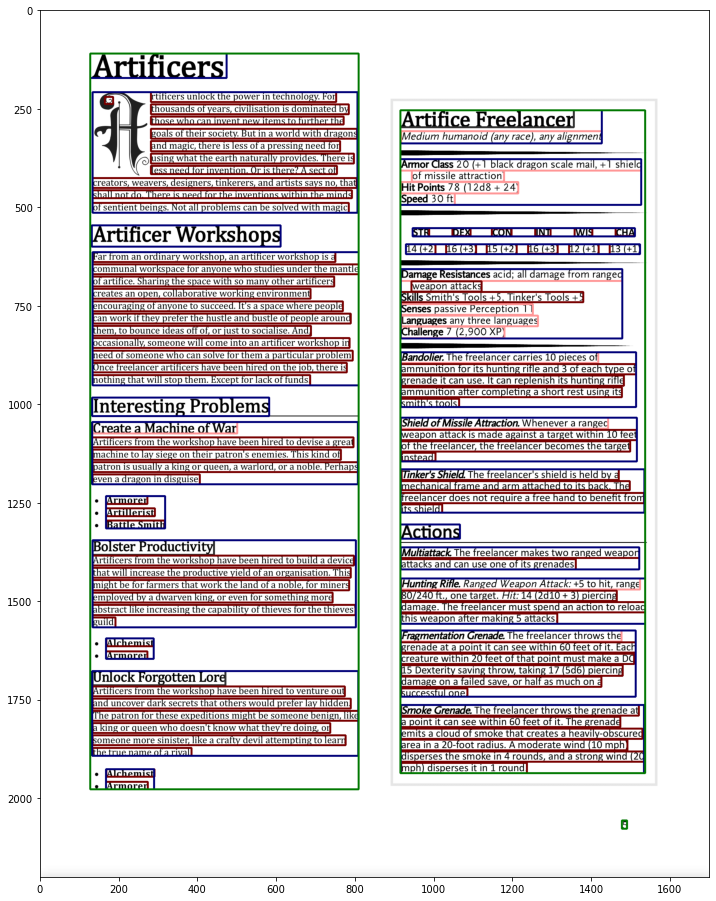

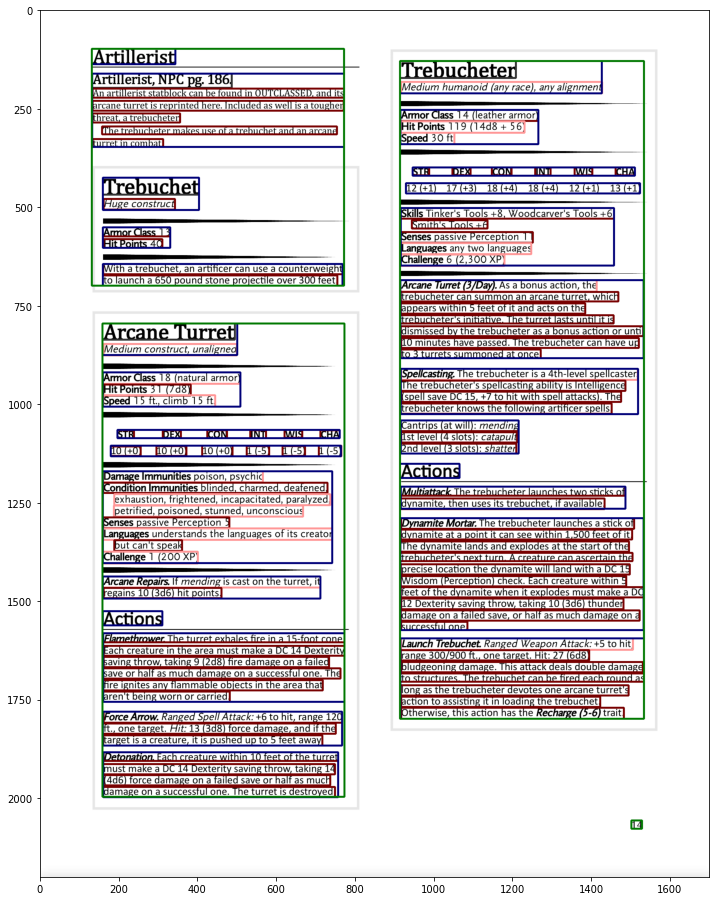

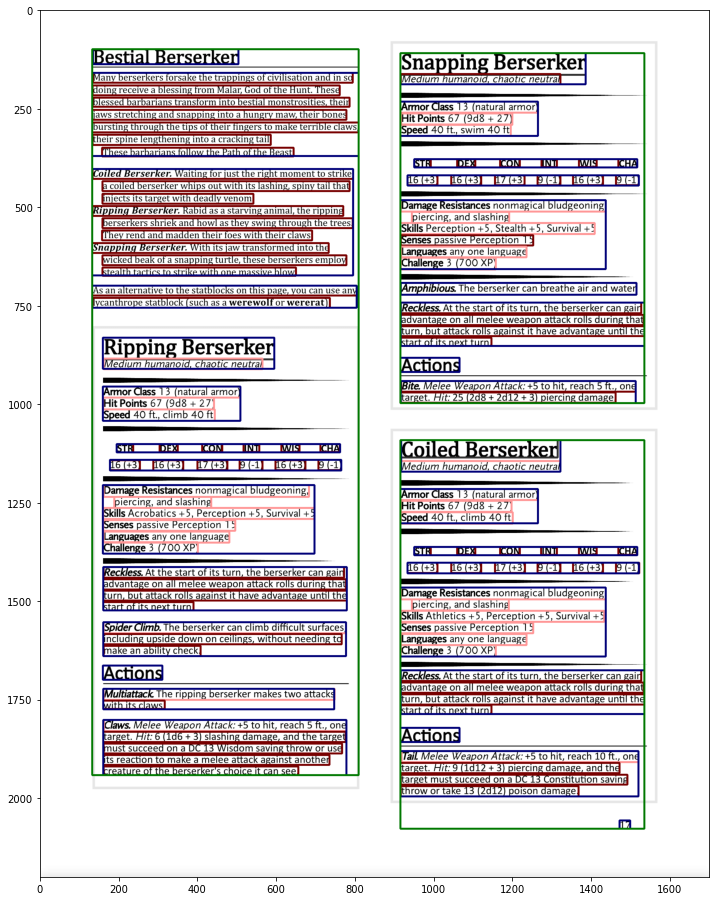

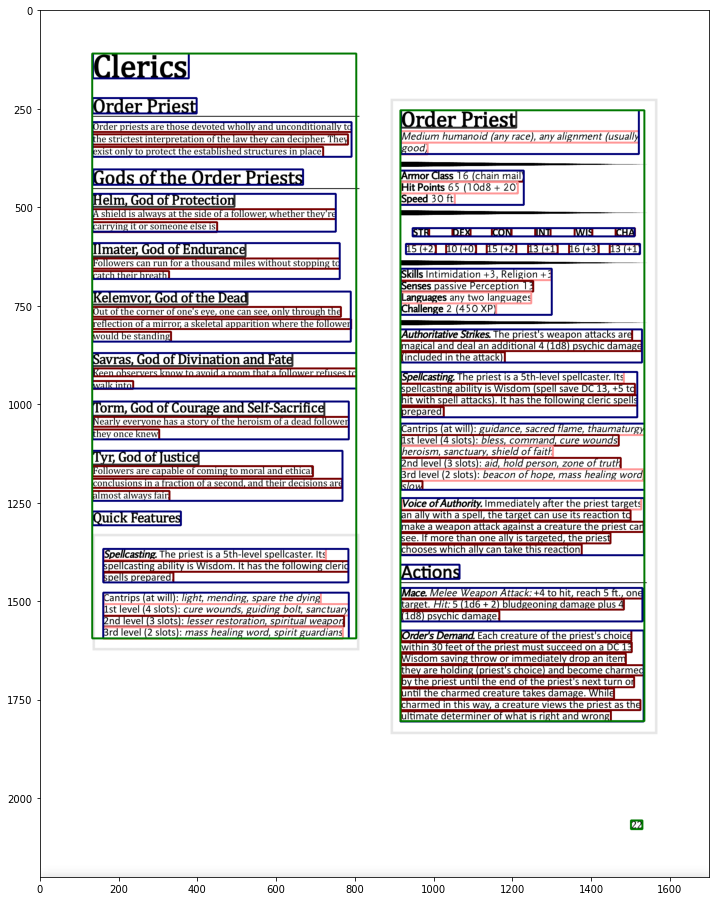

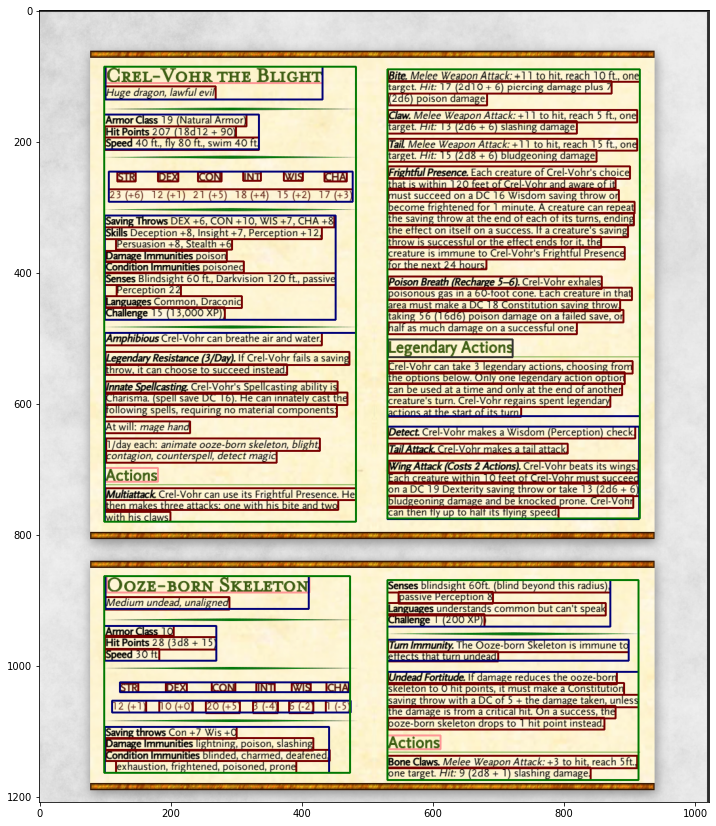

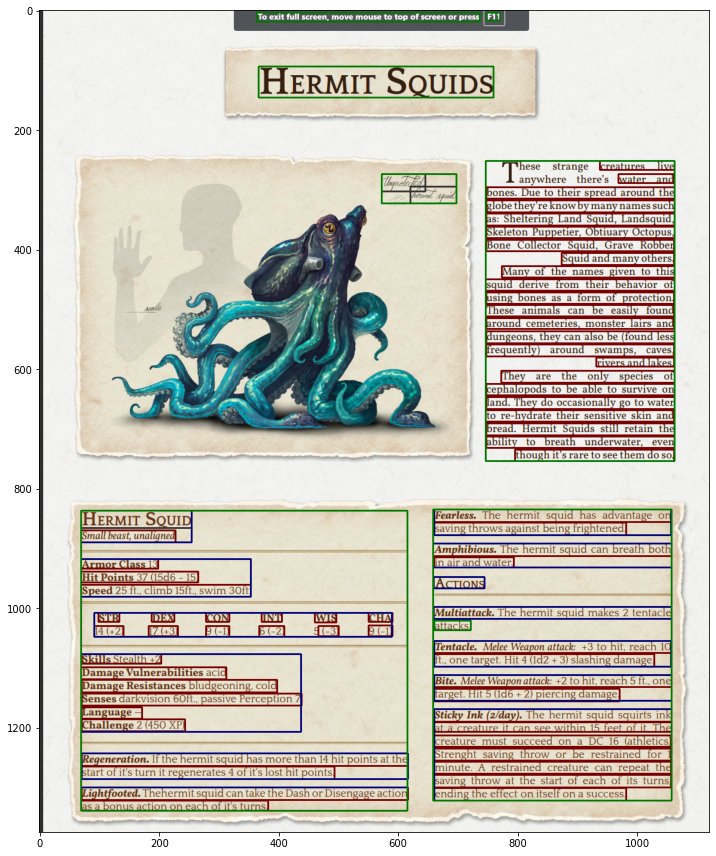

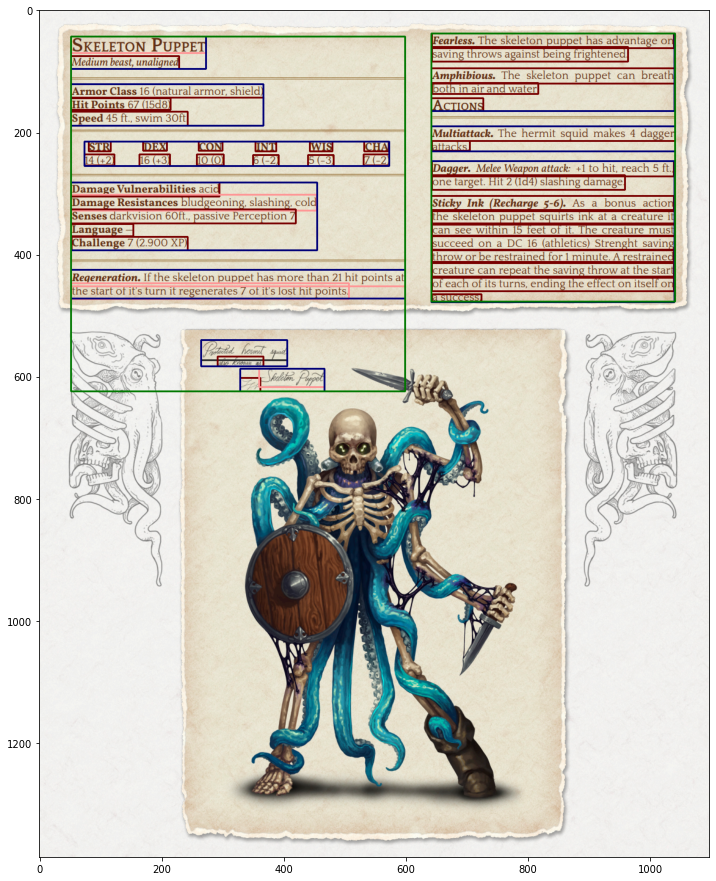

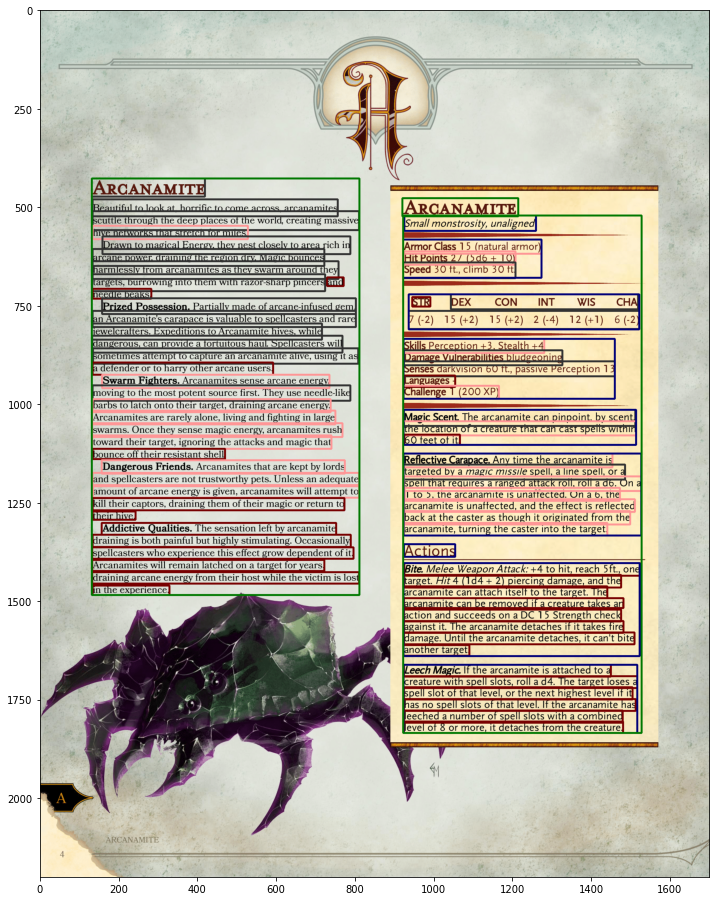

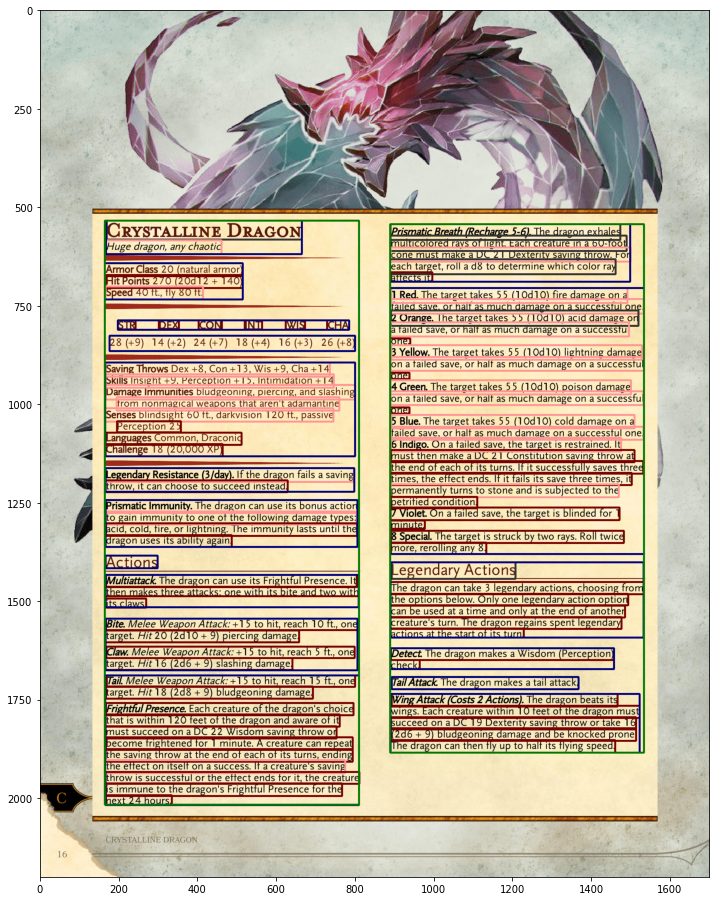

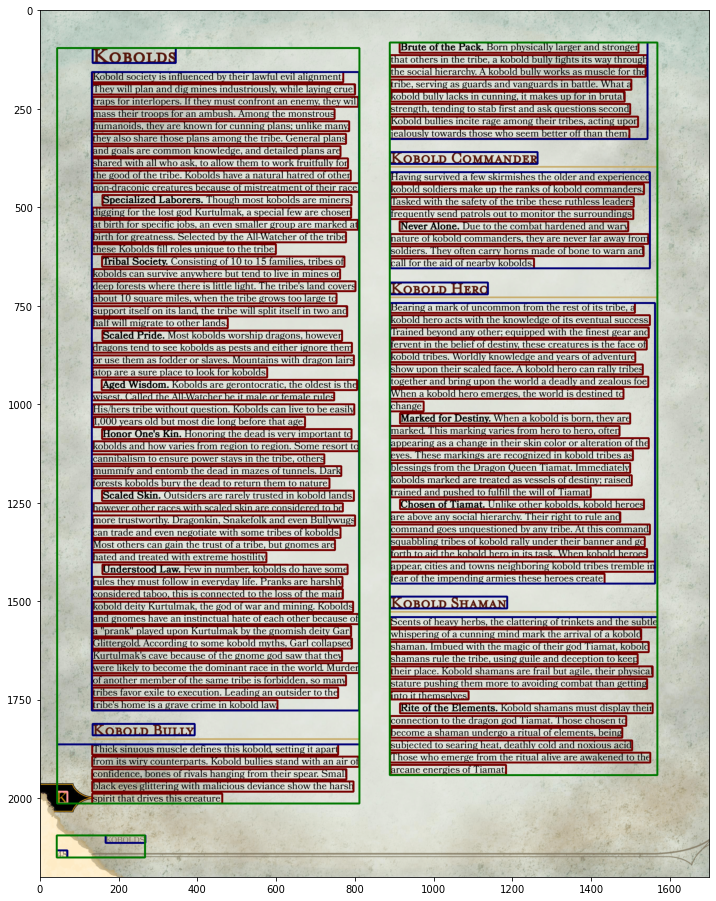

In [516]:
blue=(120, 0, 0, 120)
green = (0, 120, 0, 120)
red = (0, 0, 120, 120)
grey = (50, 50, 50, 120)
pink = (150, 150, 255, 120)

def weight_colour(x):
    if not x["large"]:
        return red
    elif not x["very_large"]:
        return pink
    else:
        return grey

def plot_line_weights(lines):
    weights = np.array([x[1]["width"] / len(x[0]) for x in lines])
    heights = np.array([x[1]["height"] for x in lines])
    #fontsize= int(weights.mean())
    #print(fontsize)
    #print(weights)
    h_bins = np.arange(10, 60, 1)
    #w_bins = np.arange(5, 20, 0.25)
    # plt.figure(figsize=(12,12))
    # plt.subplot(121)
    # plt.hist(weights, bins=w_bins)
    # plt.subplot(122)
    # plt.hist(heights, bins=h_bins)
    #print(heights)
    h_count,h_edges = np.histogram(heights, bins=h_bins)
    #w_count,w_edges = np.histogram(weights, bins=w_bins)
    h_e = h_edges[np.argmax(h_count)+1]
    #w_e = w_edges[np.argmax(w_count)+5]
    #print(h_e)#, w_e)
    #print(edges[np.argmax(count)])
    #h_e = scipy.stats.mode([int(h) for h in heights])[0] + 1
    #print(scipy.stats.mode([int(h) for h in heights]))
    for l,w,h in zip(lines, weights,heights):
        if "(" in l[0] or ")" in l[0] or 'k' in l[0]:
            h -= 1
        l[1]["font"] = w
        l[1]["font_height"] = h
        l[1]["large"] = (int(h) > h_e)
        l[1]["very_large"] = (int(h) > h_e + 5)

for fn in os.listdir("data")[:10]:
    ld = load_dir(os.path.join("data", fn))
    lines = get_columns(ld["lines"])
    plot_line_weights(ld["lines"])
    cols = [l for l in lines if l]

    paras, sections = columns_to_boxes(cols, para_fuzz=0.6, sec_fuzz=2)

    bounds = []
    colours = []

    #print(lines[0][0])
    for col in lines:
        if col is None:
            continue
        #print(col[0])
        bounds += [x[1] for x in col if x ]
        colours += [weight_colour(x[1]) for x in col]

    for col in paras:
        if col is None:
            continue
        bounds += [x[1] for x in col if x]
        colours += [blue for x in range(len(col))]

    #print(big_cols)
    for col in sections:
        if col is None:
            continue
        #print(col[0])
        bounds += [x[1] for x in col]
        colours += [green for x in range(len(col))]

    # #print(bounds)
    # #print(colours[0])
    drawBoundingBoxes(ld["img"], bounds, color=colours)